In [1]:
import sys
sys.path.append("../..")

In [2]:
#model checkpoint directory
model_path = '../../trained_models/simclr_50_ski'
backbone = 'resnet50'
#dataset name to use
dataset = 'skiPose'

# Imports

In [3]:
import os
import torch
import re
import random
from torchvision.io import read_image

import matplotlib.pyplot as plt
import torchvision.transforms as T

from torch import nn

## SimCLR method
[SimCLR](https://arxiv.org/pdf/2002.05709.pdf) I take the base encoder model (ResNet50) and replace its fully connected layer with a projection head.

In [4]:
from contrastive_training.simclr.model import get_simclr_net

# Clustering

I extract the representations from the trained model and run K means clustering algorithm (number of clusters=8) on these representation. I reduce the dimentionality of the representations with PCA and LDA algorithm and plot the clustering.
For the comparison I use the representations extracted from encoder model (before the projection head) and the representations extracted after the projection head.

## Setup

In [5]:
from dataloaders.datasets import cluster_datasets

In [6]:
device = 'cpu'
if torch.cuda.is_available():
    device = 'cuda'

In [7]:
def get_cluster_data(batch_size, dataset='panoptic'):
    transforms = T.Compose(
        [
            T.ToTensor(),
            T.Resize(size=(128, 128)),
        ]
    )

    cluster_dataset = cluster_datasets[dataset](transforms, dataset_dir='../../datasets')
    
    cluster_loader = torch.utils.data.DataLoader(cluster_dataset, batch_size)

    return cluster_dataset, cluster_loader

In [8]:
def extract_representations(path, cluster_loader, load=True):
    net = get_simclr_net(backbone)

    if load:
        net.load_state_dict(torch.load(path))

    net.to(device)
    net.eval()

    proj_repr = []
    base_repr = []

    with torch.no_grad():
        for batch_idx, inputs in enumerate(cluster_loader):
            images = inputs['image']
            images.to(device)
            base, proj = net(images)
            proj_repr.append(proj)
            base_repr.append(base)

    return torch.cat(base_repr).cpu().numpy(), torch.cat(proj_repr).cpu().numpy()

In [9]:
from sklearn.cluster import KMeans


def kmeans_algorithm(features, n_clusters=8, random_state=0):
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    kmeans.fit(features)

    return kmeans.labels_

In [10]:
#import LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
#import PCA
from sklearn.decomposition import PCA

def reduce_dim_LDA(features, labels, n_components=2):
    lda = LDA(n_components=n_components)
    lda.fit(features, labels)

    return lda.transform(features)

def reduce_dim_PCA(features, n_components=2):
    pca = PCA(n_components=n_components)
    pca.fit(features)

    return pca.transform(features)

In [11]:
def plot_clusters(clusters, features, title):
    colors = {
        0: '#F8512E', 1: '#F8F82E',
        2: '#40F82E', 3: '#2EC1F8',
        4: '#6B2EF8', 5: '#D92EF8',
        6: '#731642', 7: '#092040'
    }

    cluster_colors = [colors[c] for c in clusters]

    plt.scatter(features[:, 0], features[:, 1], c=cluster_colors)
    plt.title(title)
    plt.show()

In [12]:
from sklearn.metrics import silhouette_score


def cluster(model_path, load=True, n_clusters=8, n_components=2, dataset='panoptic', random_state=0):
    cluster_set, cluster_loader = get_cluster_data(30, dataset)

    base_features, proj_features = extract_representations(model_path, cluster_loader, load)

    labels_base = kmeans_algorithm(features=base_features, n_clusters=n_clusters, random_state=random_state)
    lda_base = reduce_dim_LDA(features=base_features, labels=labels_base, n_components=n_components)
    pca_base = reduce_dim_PCA(features=base_features, n_components=n_components)

    labels_proj = kmeans_algorithm(proj_features, n_clusters=n_clusters, random_state=random_state)
    lda_proj = reduce_dim_LDA(features=proj_features, labels=labels_proj, n_components=n_components)
    pca_proj = reduce_dim_PCA(features=proj_features, n_components=n_components)

    silhouette_base = silhouette_score(base_features, labels_base)
    silhouette_proj = silhouette_score(proj_features, labels_proj)

    print("Silhouette score for the encoder features: {}".format(silhouette_base))
    print("Silhouette score for the projection head features: {}".format(silhouette_proj))

    plot_clusters(labels_base, lda_base, "Encoder features LDA")
    plot_clusters(labels_proj, lda_proj, "Projection head features LDA")

    plot_clusters(labels_base, pca_base, "Encoder features PCA")
    plot_clusters(labels_proj, pca_proj, "Projection head features PCA")

    return cluster_set, base_features, proj_features, labels_base, labels_proj, lda_base, lda_proj, pca_base, pca_proj

In [13]:
#get the latest model
epoch = 0
for file in os.listdir(model_path):
    if 'epoch' in file:
        e = int(re.findall(r'\d+', file)[0])
        if e > epoch:
            epoch = e

path = model_path + '/epoch_{:d}.pt'.format(epoch)
print(path)

#path="trained_models/ver1.pt"

../../trained_models/simclr_50_ski/epoch_5.pt


## Before training

In [14]:
# _, _, _, _, _, _, _, _, _ = cluster(path, load=False, n_clusters=8, n_components=2, dataset=dataset, random_state=0)

## Trained model
visualization based on the model preprained with 0.0001 learning rate for base encoder

C:\Users\david\AppData\Local\Temp\ipykernel_10288\1845444856.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  net.load_state_dict(torch.load(path))


Silhouette score for the encoder features: 0.3256014287471771
Silhouette score for the projection head features: 0.2519940137863159


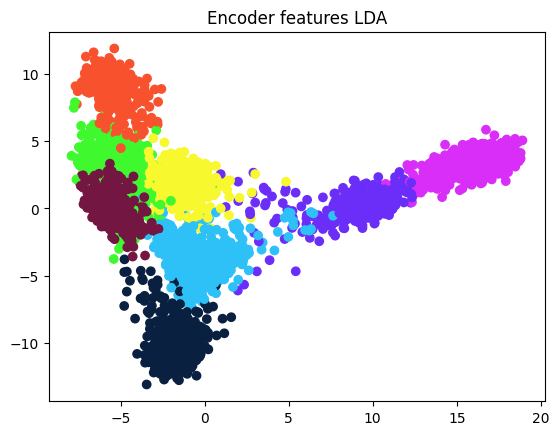

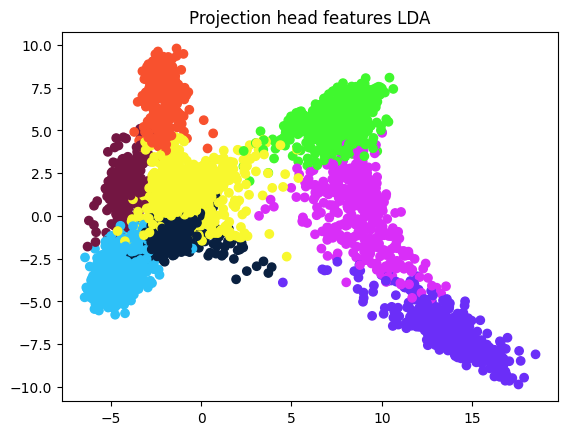

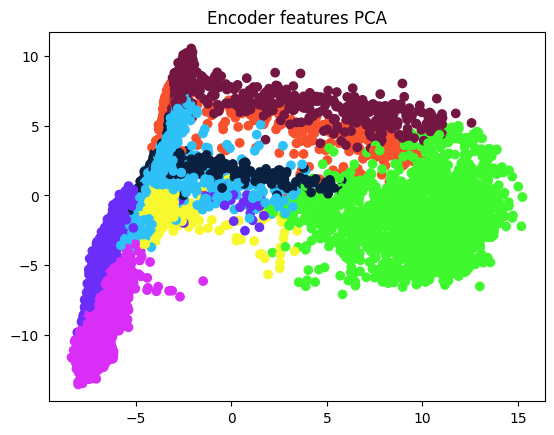

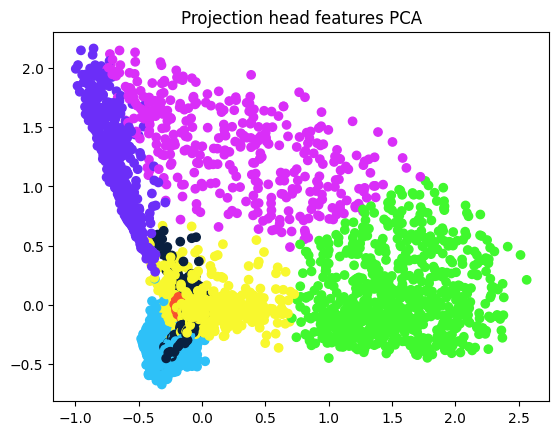

In [15]:
cluster_set, base_features, proj_features, labels_base, labels_proj, lda_base, lda_proj, pca_base, pca_proj = cluster(
    path, load=True, n_clusters=8, n_components=2, dataset=dataset, random_state=0
    )

### Clustering results

In [16]:
def plot_one_cluster(dataset, cluster_ind, labels):
    indexes = [i for i in range(0, len(labels)) if labels[i]==cluster_ind]

    plt.figure(figsize = (10,10))

    for i in range(0, 9):
        ax = plt.subplot(3, 3, i+1)
        ax.imshow(dataset[indexes[random.randint(0, len(indexes)-1)]]['image'].permute(1, 2, 0))

    plt.show()

#### Base encoder
Clustering based on features extracted from base encoder

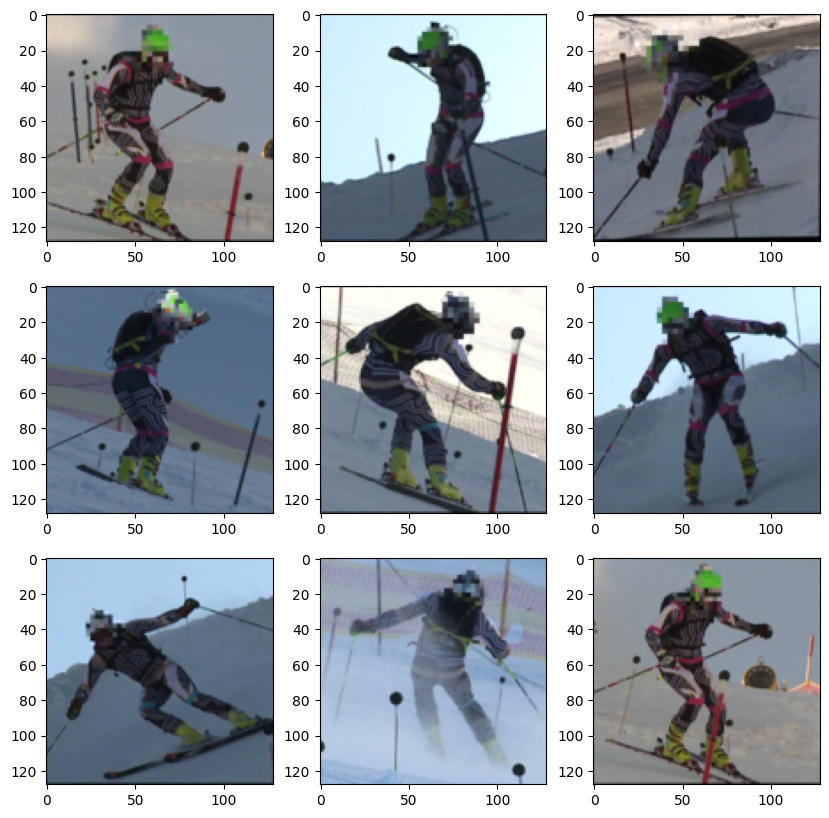

In [17]:
plot_one_cluster(cluster_set, 0, labels_base)

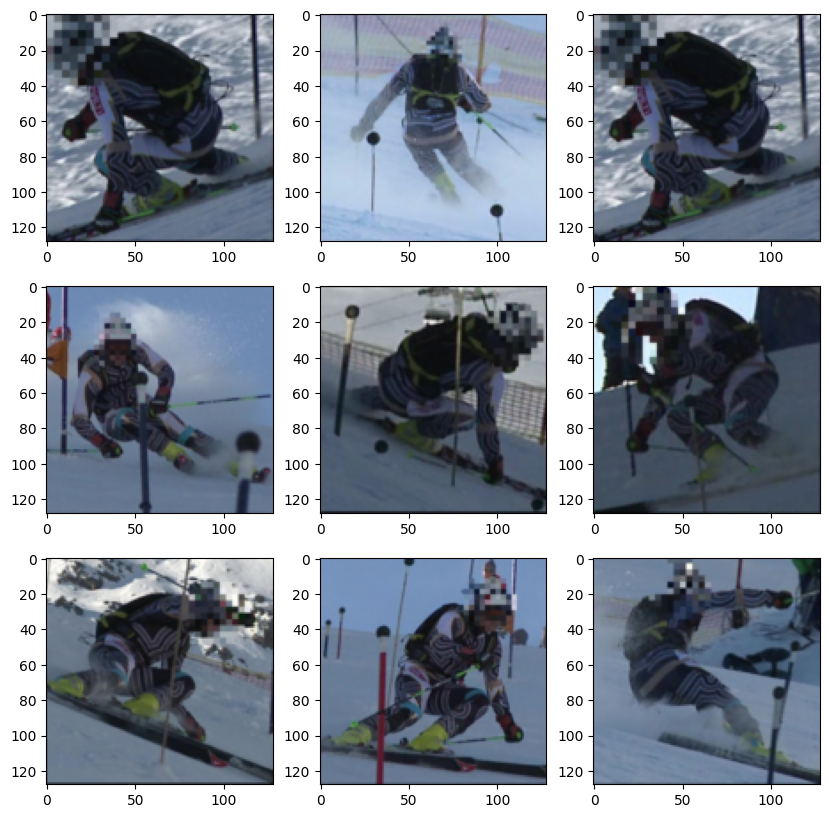

In [18]:
plot_one_cluster(cluster_set, 1, labels_base)

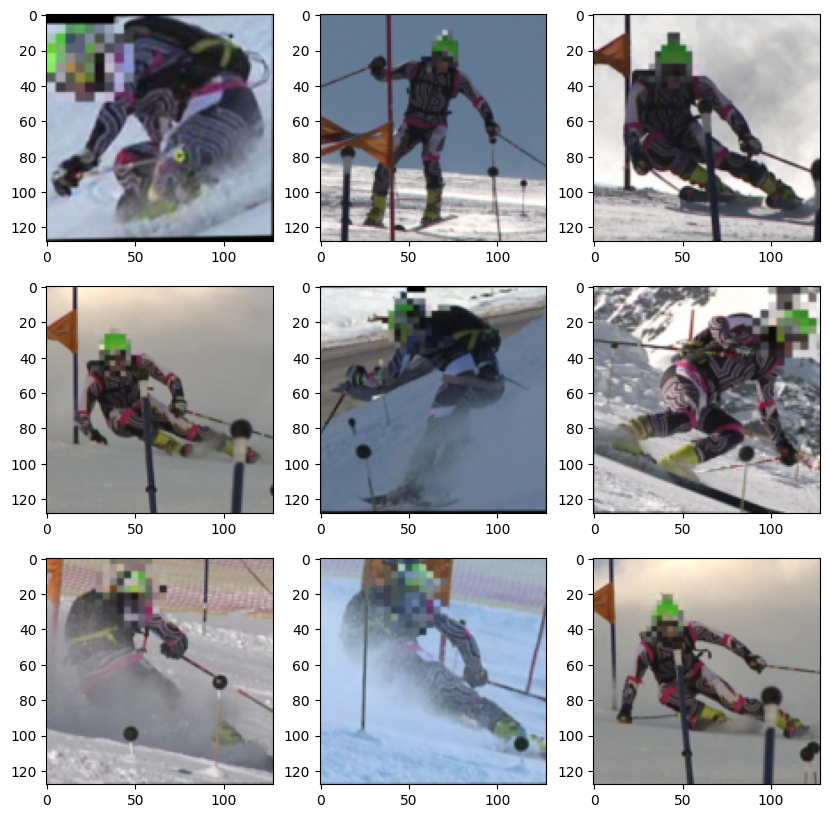

In [19]:
plot_one_cluster(cluster_set, 2, labels_base)

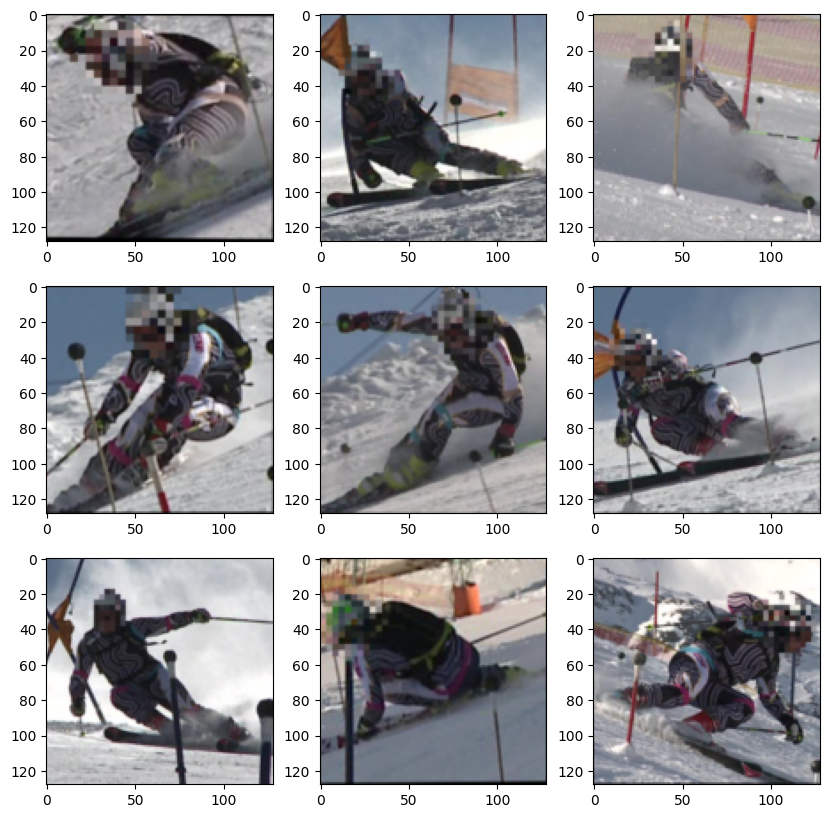

In [20]:
plot_one_cluster(cluster_set, 3, labels_base)

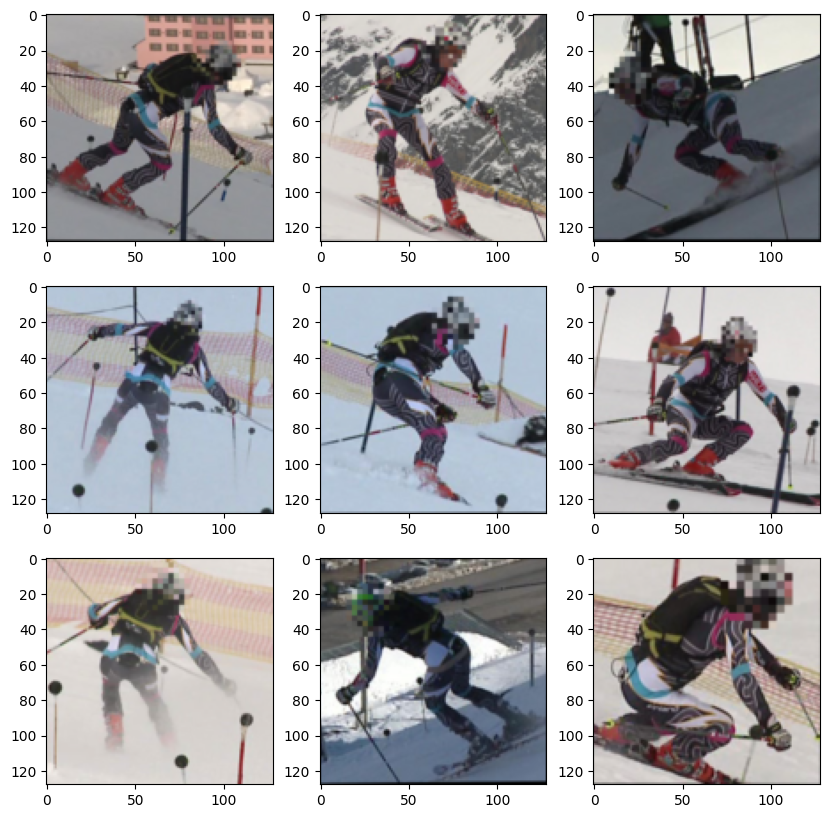

In [21]:
plot_one_cluster(cluster_set, 4, labels_base)

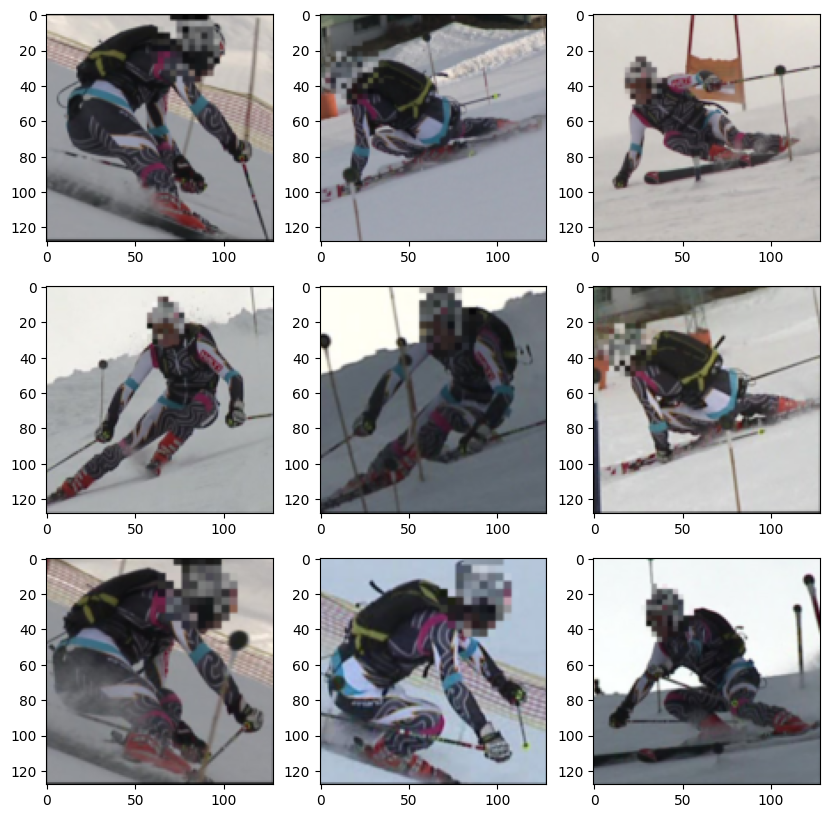

In [22]:
plot_one_cluster(cluster_set, 5, labels_base)

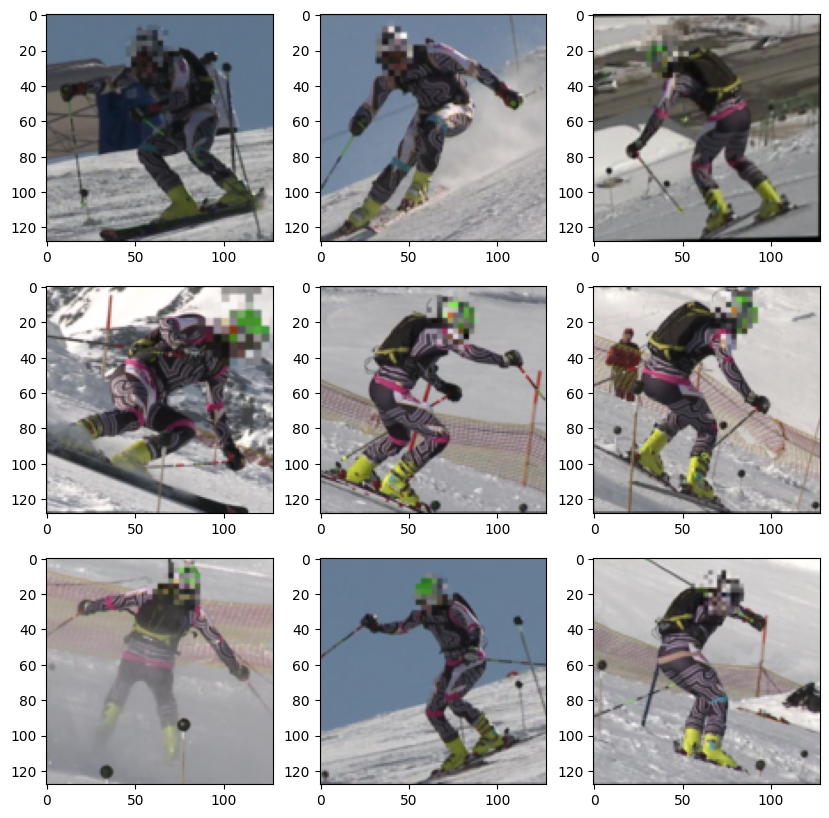

In [23]:
plot_one_cluster(cluster_set, 6, labels_base)

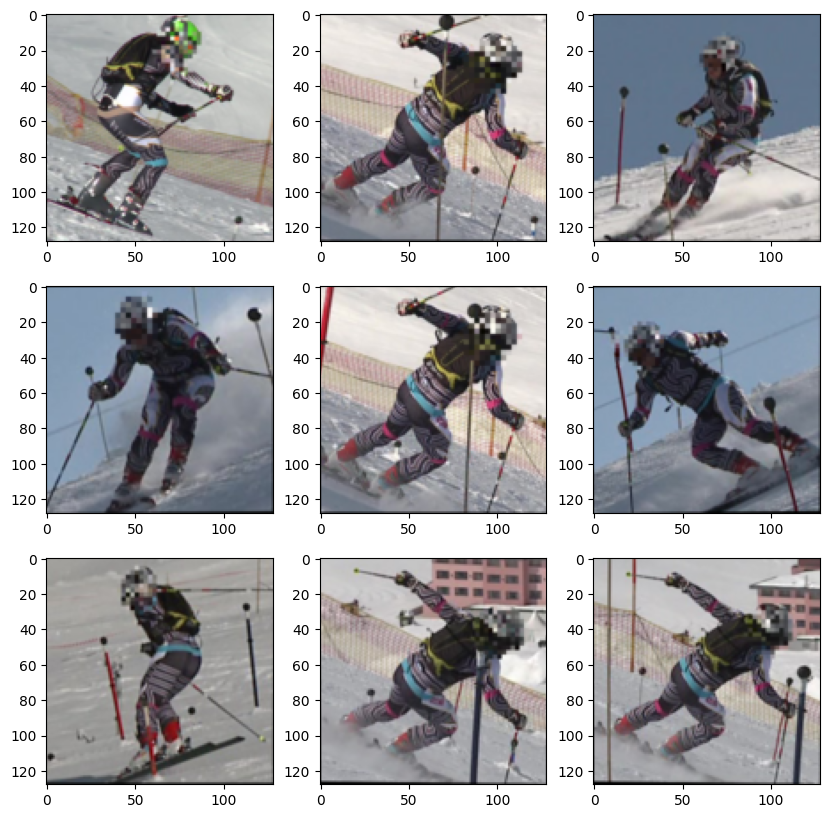

In [24]:
plot_one_cluster(cluster_set, 7, labels_base)

#### Projection head
Clustering based on features extracted from projection head

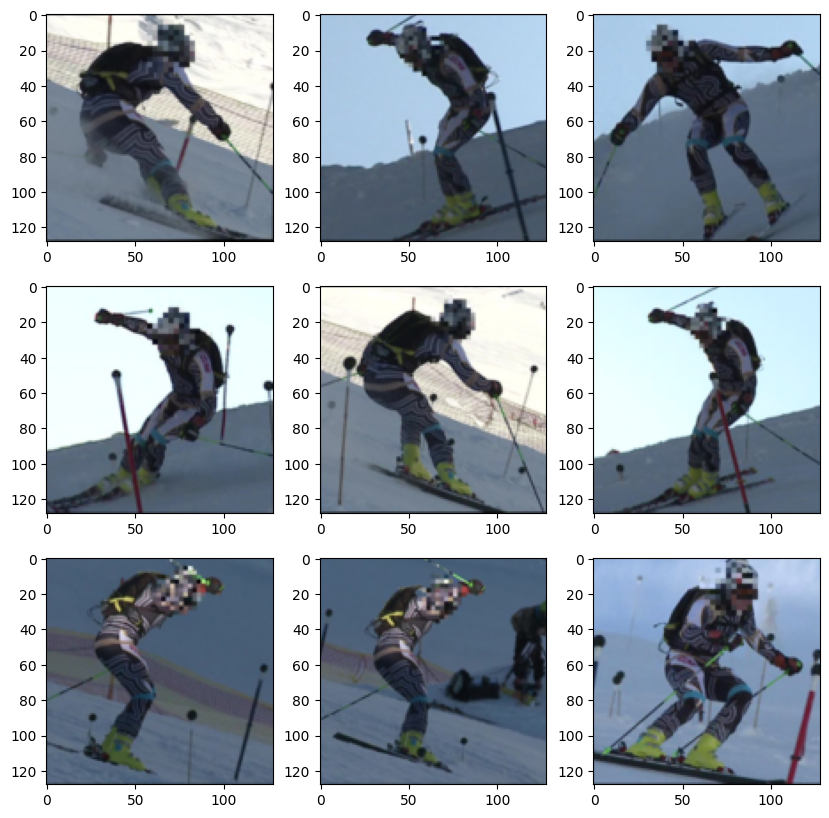

In [25]:
plot_one_cluster(cluster_set, 0, labels_proj)

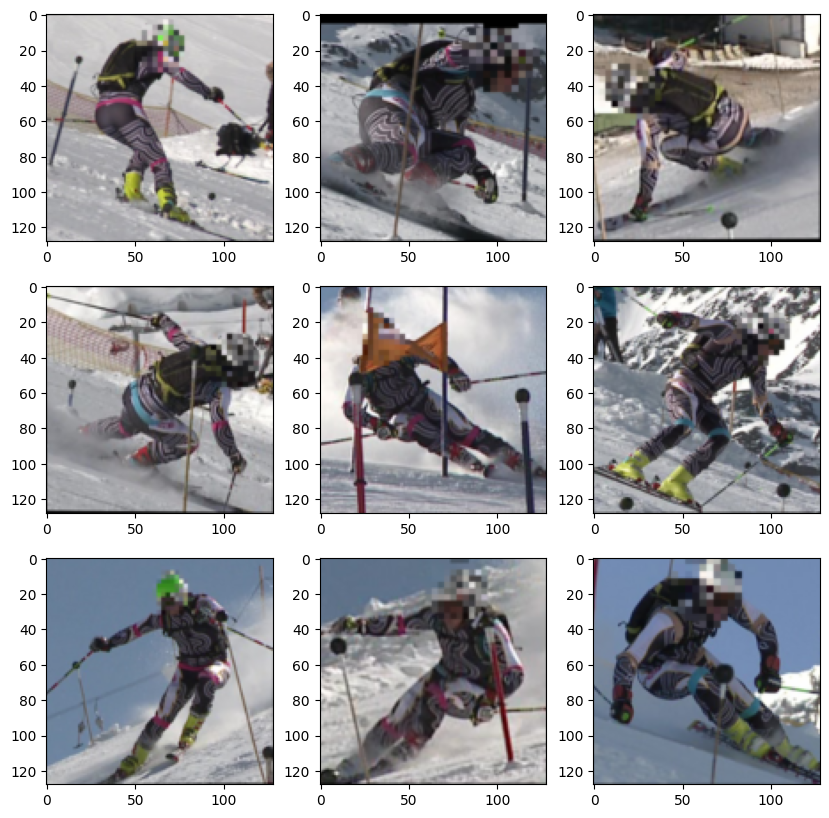

In [26]:
plot_one_cluster(cluster_set, 1, labels_proj)

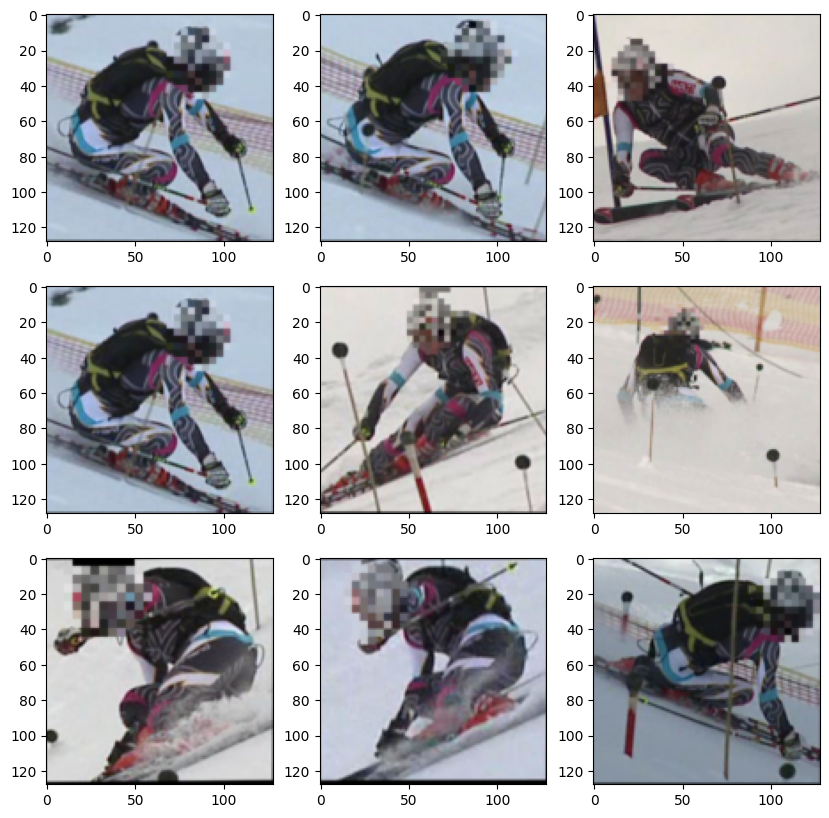

In [27]:
plot_one_cluster(cluster_set, 2, labels_proj)

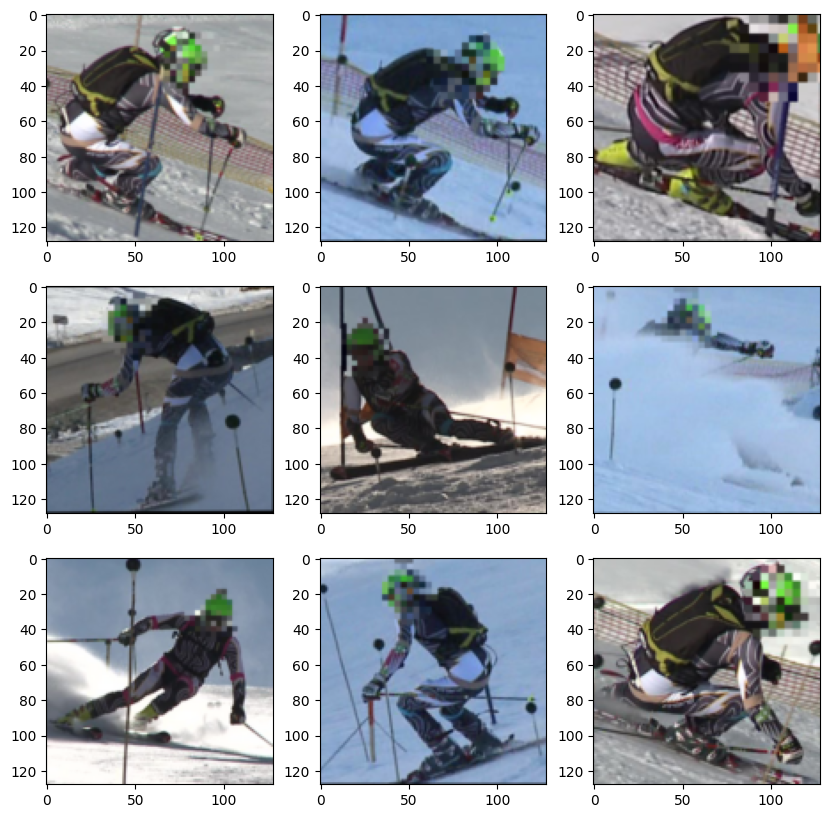

In [28]:
plot_one_cluster(cluster_set, 3, labels_proj)

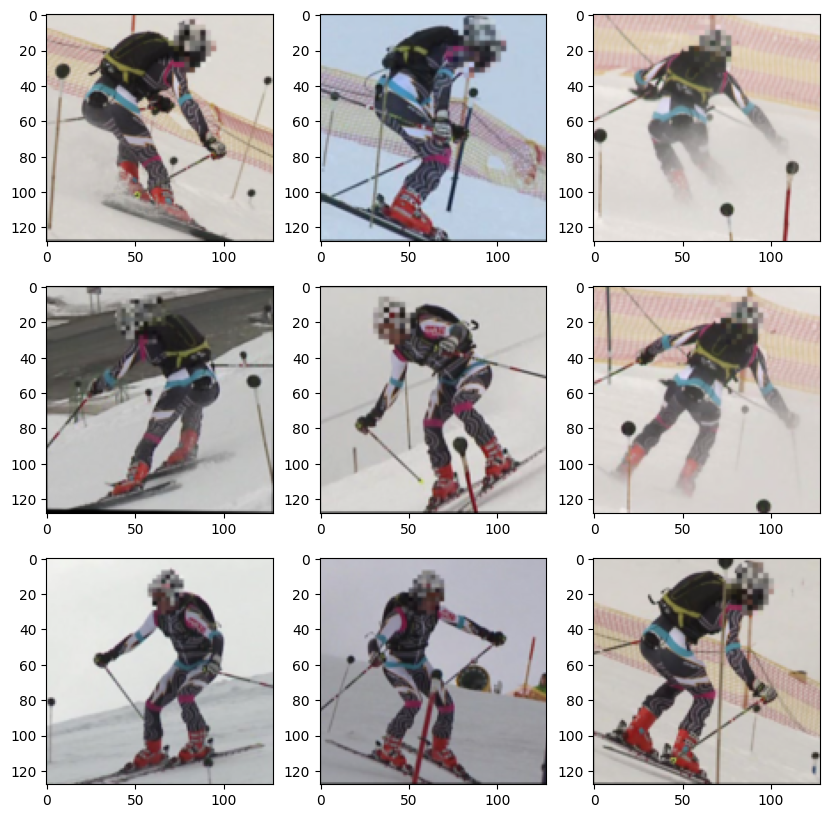

In [29]:
plot_one_cluster(cluster_set, 4, labels_proj)

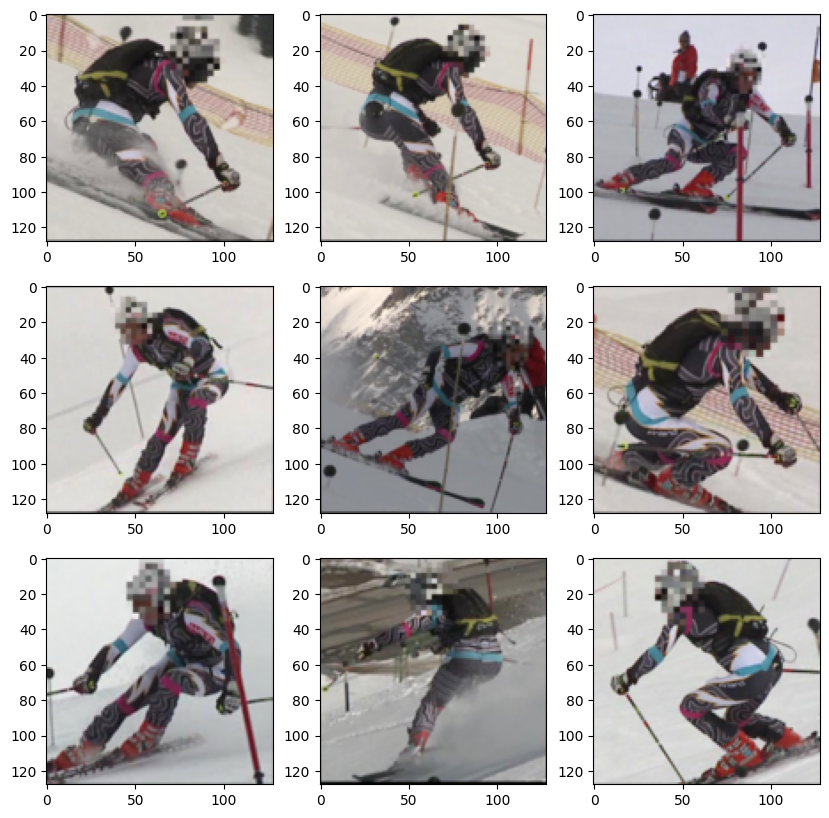

In [30]:
plot_one_cluster(cluster_set, 5, labels_proj)

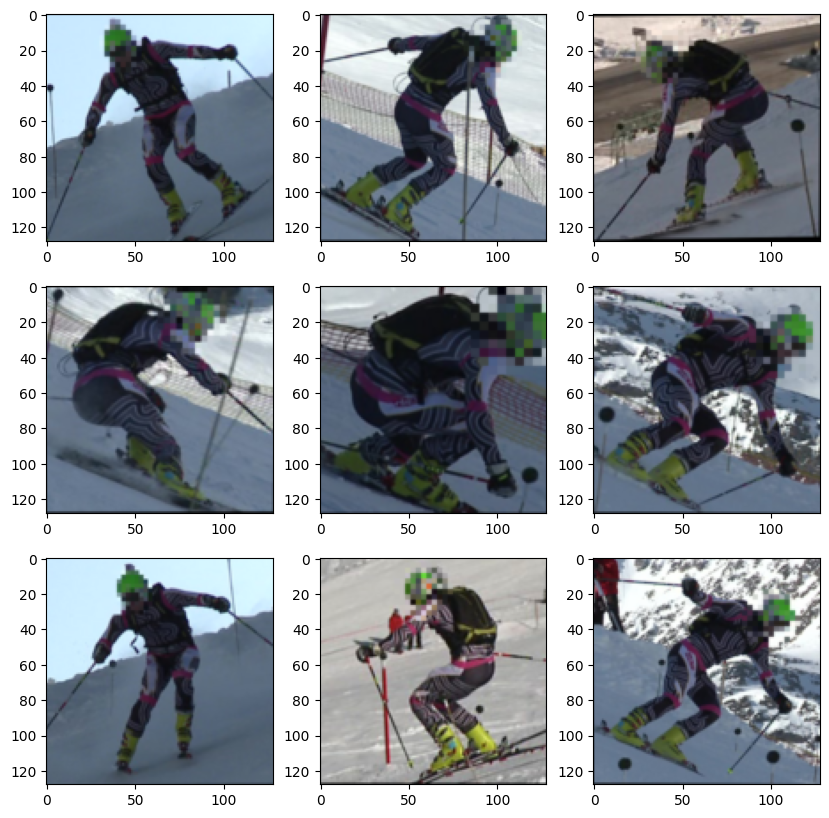

In [31]:
plot_one_cluster(cluster_set, 6, labels_proj)

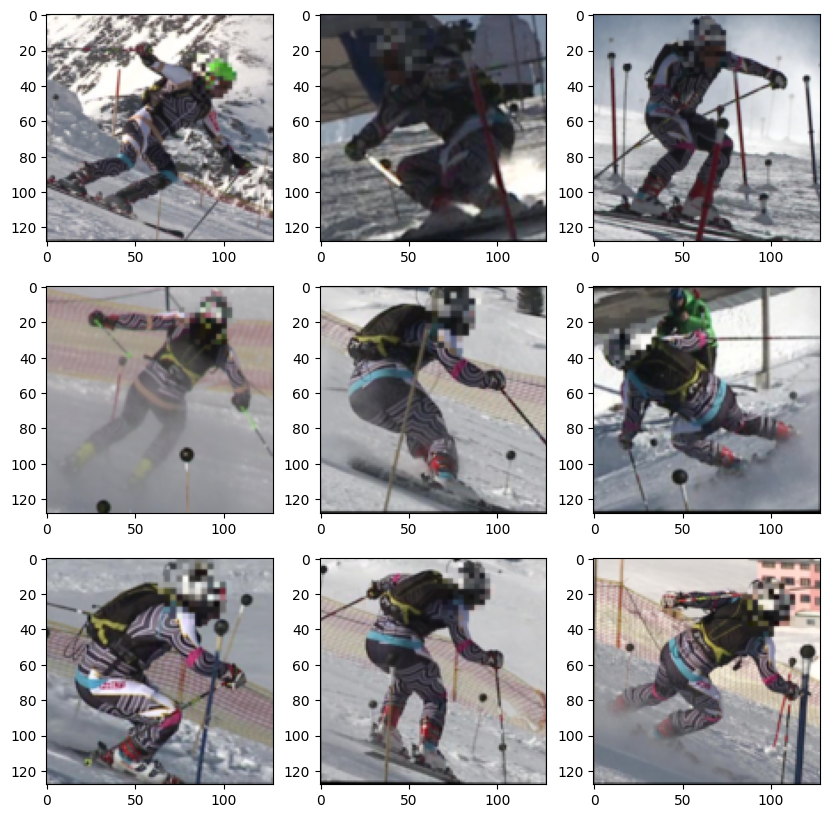

In [32]:
plot_one_cluster(cluster_set, 7, labels_proj)